# Import dependencies

In [1]:
#import all 
%matplotlib inline
import matplotlib
from pandas.io.parsers import read_csv
import numpy as np
import seaborn as sns
import pandas as pd
import sklearn.cluster as cluster
import matplotlib.pyplot as plt
import collections
import scipy

from scipy.ndimage.filters import gaussian_filter1d

import warnings
warnings.filterwarnings("ignore")

import scanpy as sc
dpi = 50
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=dpi, color_map = 'viridis')

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.20.3 scipy==1.7.3 pandas==1.4.1 scikit-learn==0.23.2 statsmodels==0.12.2 pynndescent==0.5.6


# Read in dataframes

This is necessary for computing percentages. If these are already computed and saved, move down to 'load computed datasets'.

In [2]:
pathToData = '/Users/m.blotenburg/Documents/Projects/Mouse_Scartrace/Data_analysis/clonalLines/20200128_clonalLinesKaryo_OlaB6/'

First we have to import all count tables separately, then we will merge them into one dataframe df.

In [3]:
def readInNLAPlate(pathToFile, replaceToString):
    NLAplate = read_csv((pathToData + pathToFile),sep = ',', low_memory=False, index_col=(0,1,2,3))
    NLAplate = NLAplate.loc[[idx for idx in NLAplate.index if 'Unknown'!=idx]]
    NLAplate = NLAplate.iloc[1:]
    NLAplate.columns = NLAplate.columns.str.replace((NLAplate.columns[0].rsplit('_',1)[0] + '_'), (replaceToString + '.'))
    NLAplate.index.names = ['allele','chrom','bin_start','bin_end']
    NLAplate.columns = pd.MultiIndex.from_tuples( [ (x.split('.',3)[0], x.split('.',3)[1]) for x in NLAplate.columns] )
    NLAplate = NLAplate[sorted(NLAplate.columns)]
    return NLAplate

In [4]:
plate1c1 = readInNLAPlate('MB-clonallines-nla-karyo-plate1c1/count_table_250000_250000.csv','1c1')
plate1c2 = readInNLAPlate('MB-clonallines-nla-karyo-plate1c2/count_table_250000_250000.csv','1c2')
plate1c3 = readInNLAPlate('MB-clonallines-nla-karyo-plate1c3/count_table_250000_250000.csv','1c3')
plate2c1 = readInNLAPlate('MB-clonallines-nla-karyo-plate2c1/count_table_250000_250000.csv','2c1')
plate2c2 = readInNLAPlate('MB-clonallines-nla-karyo-plate2c2/count_table_250000_250000.csv','2c2')
plate2c3 = readInNLAPlate('MB-clonallines-nla-karyo-plate2c3/count_table_250000_250000.csv','2c3')
plate2c4 = readInNLAPlate('MB-clonallines-nla-karyo-plate2c4/count_table_250000_250000.csv','2c4')
plate2c5 = readInNLAPlate('MB-clonallines-nla-karyo-plate2c5/count_table_250000_250000.csv','2c5')
plate2c6 = readInNLAPlate('MB-clonallines-nla-karyo-plate2c6/count_table_250000_250000.csv','2c6')
plate2c7 = readInNLAPlate('MB-clonallines-nla-karyo-plate2c7/count_table_250000_250000.csv','2c7')
plate2c8 = readInNLAPlate('MB-clonallines-nla-karyo-plate2c8/count_table_250000_250000.csv','2c8')
plate2c9 = readInNLAPlate('MB-clonallines-nla-karyo-plate2c9/count_table_250000_250000.csv','2c9')
plate3c1 = readInNLAPlate('MB-clonallines-nla-karyo-plate3c1/count_table_250000_250000.csv','3c1')
plate3c2 = readInNLAPlate('MB-clonallines-nla-karyo-plate3c2/count_table_250000_250000.csv','3c2')
plate3c3 = readInNLAPlate('MB-clonallines-nla-karyo-plate3c3/count_table_250000_250000.csv','3c3')

# Check quality of the data, barcode bleed through etc.

First we will check the barcode bleedthrough. Plates are pooled by column, so every sequencing sample has a maximum of 8 bulk samples - except plate 1 column 3, which has been indexed the same way as plate 2 column 9 - these combined contain 9 bulk samples.

Overview:

plate | number of bulk samples
---|---
plate1c1 | 8
plate1c2 | 8
plate1c3| 6
plate2c1 | 8
plate2c2 | 8
plate2c3 | 8
plate2c4 | 8 
plate2c5 | 8
plate2c6 | 8
plate2c7 | 8
plate2c8 | 8
plate2c9 | 3
plate3c1 | 8
plate3c2 | 8
plate3c3 | 6



In [5]:
def plotSumsPlate(plate, colour = 'mediumseagreen',figsize=(10,5)):
    sums_cells = plate.sum(axis=0)
    sns.set(style="white")
    plt.figure(figsize=(figsize))
    ax = sns.barplot(x=sums_cells.index.levels[1], y=sums_cells, log='y', color= colour)
    ax.set_title('Plate'+ plate.columns.levels[0][0])
    ax.set(xlabel='Index nr', ylabel='Total counts')
    return ax

<AxesSubplot:title={'center':'Plate1c2'}, xlabel='Index nr', ylabel='Total counts'>

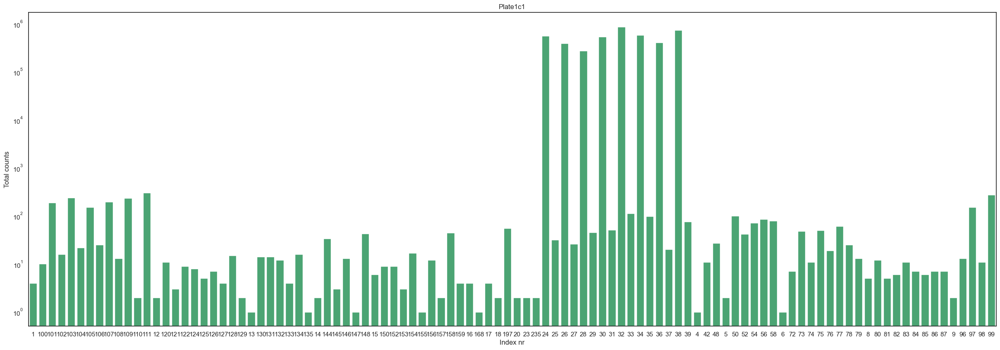

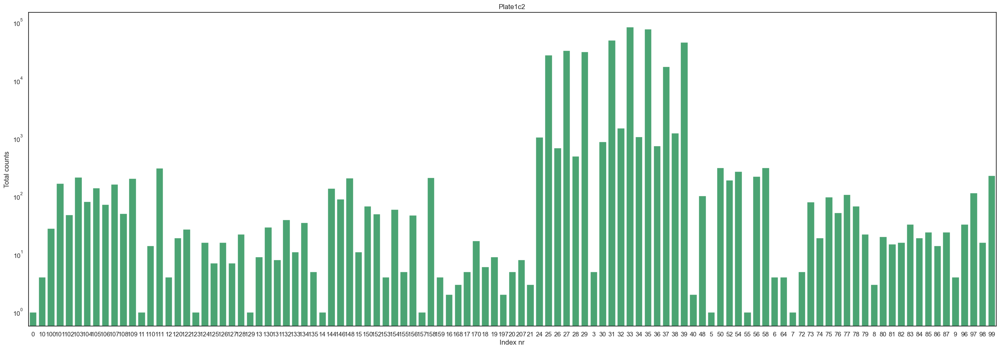

In [6]:
plotSumsPlate(plate1c1, figsize = (30,10))
plotSumsPlate(plate1c2, figsize = (30,10))

<AxesSubplot:title={'center':'Plate1c3'}, xlabel='Index nr', ylabel='Total counts'>

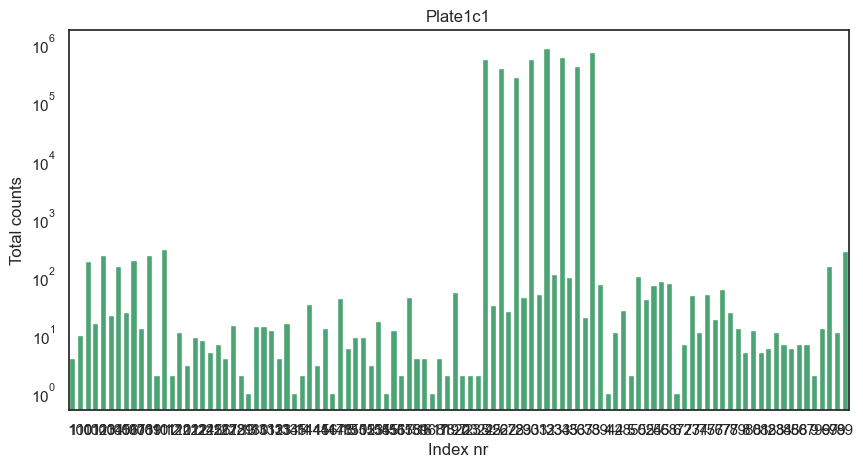

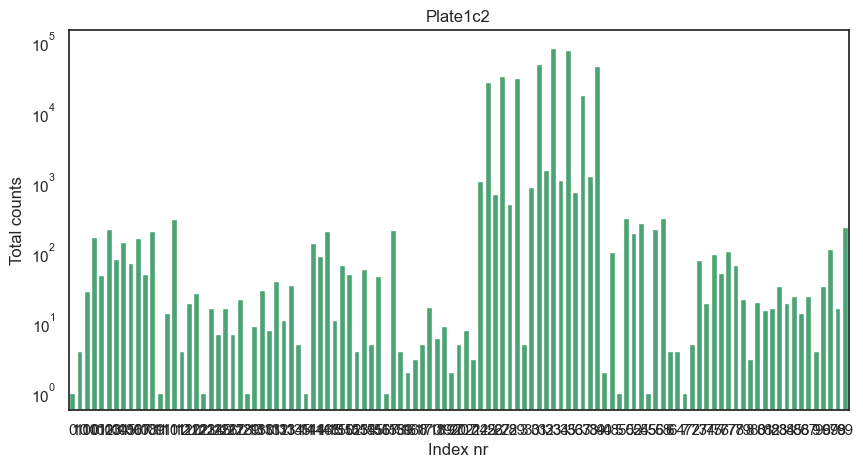

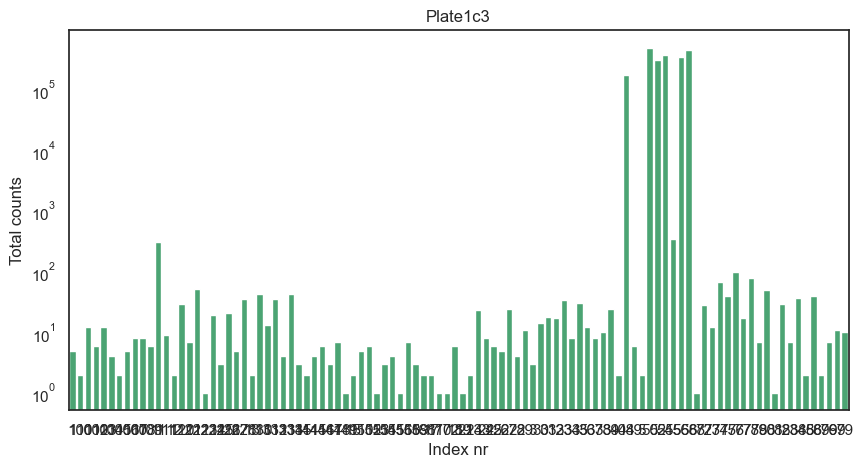

In [7]:
plotSumsPlate(plate1c1)
plotSumsPlate(plate1c2)
plotSumsPlate(plate1c3)

<AxesSubplot:title={'center':'Plate2c9'}, xlabel='Index nr', ylabel='Total counts'>

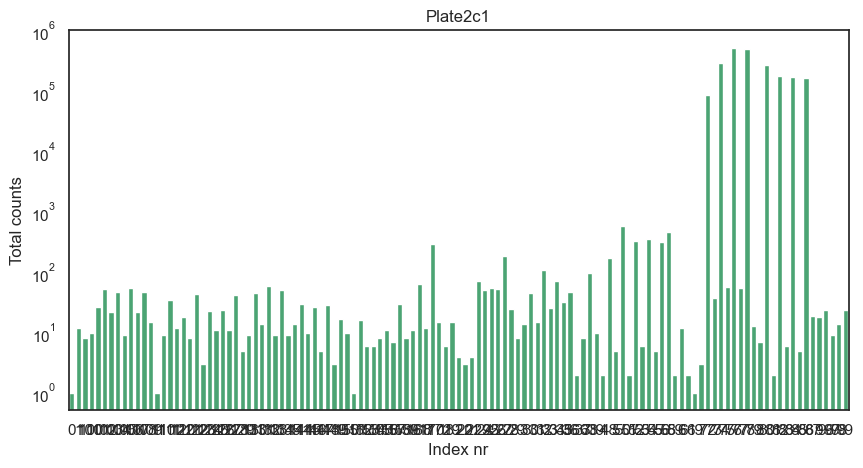

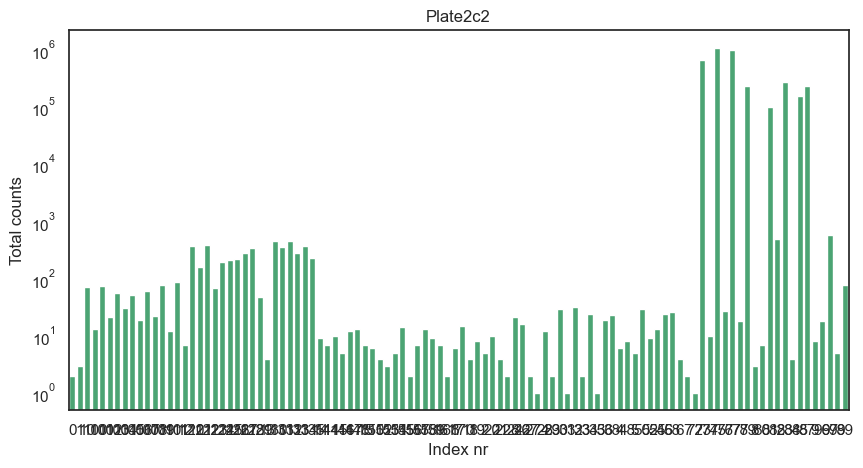

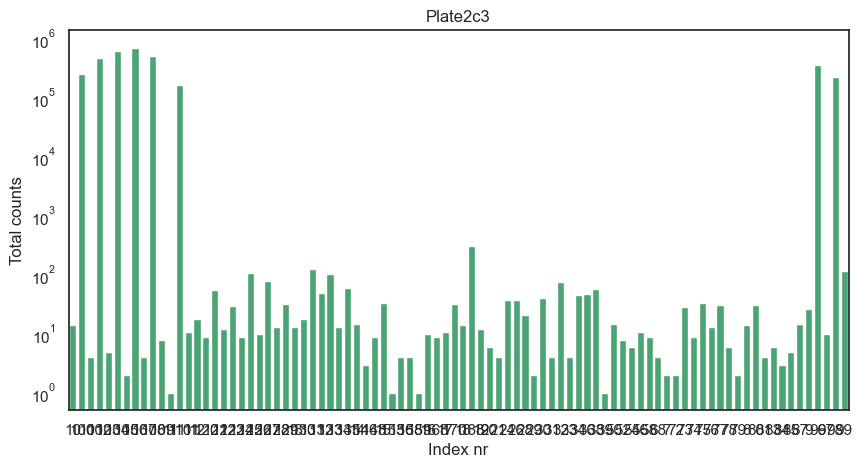

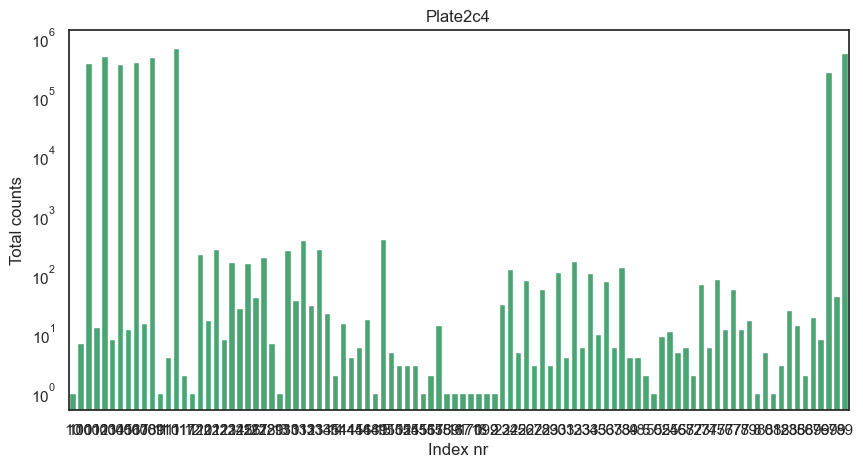

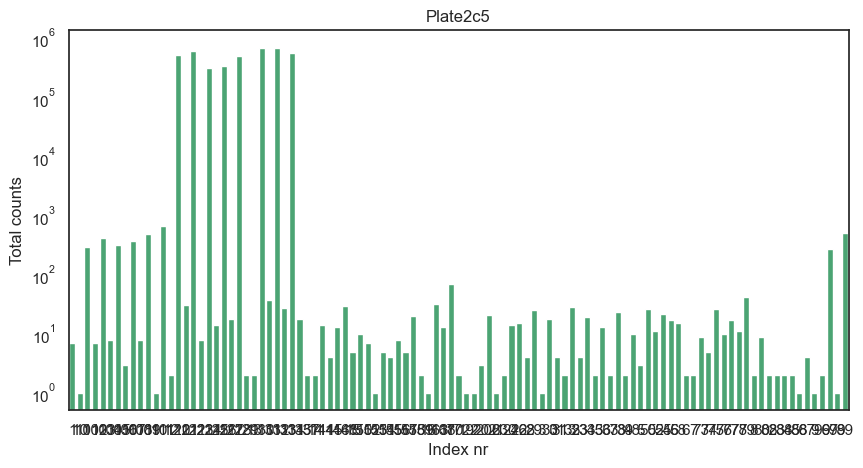

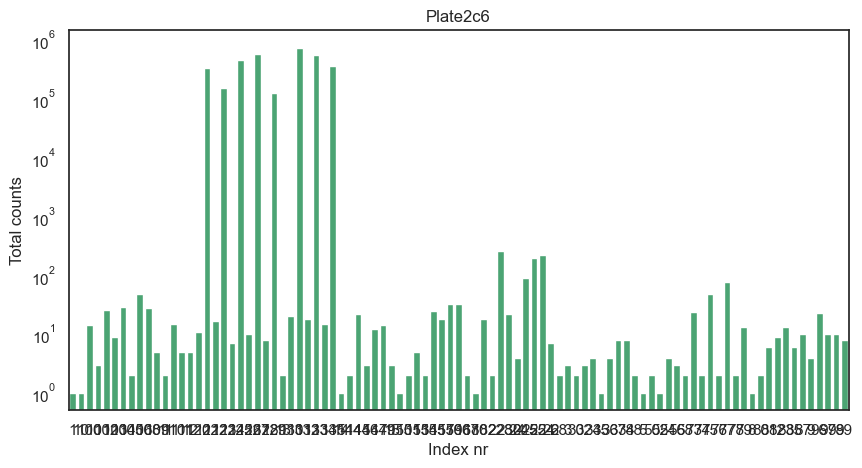

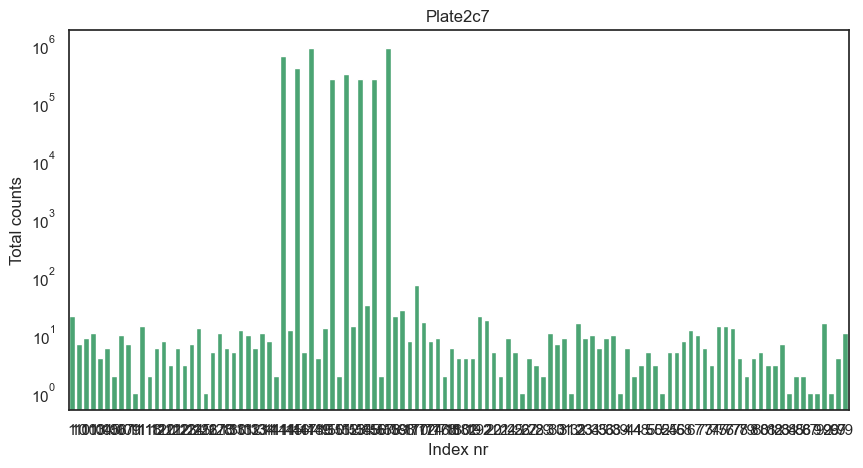

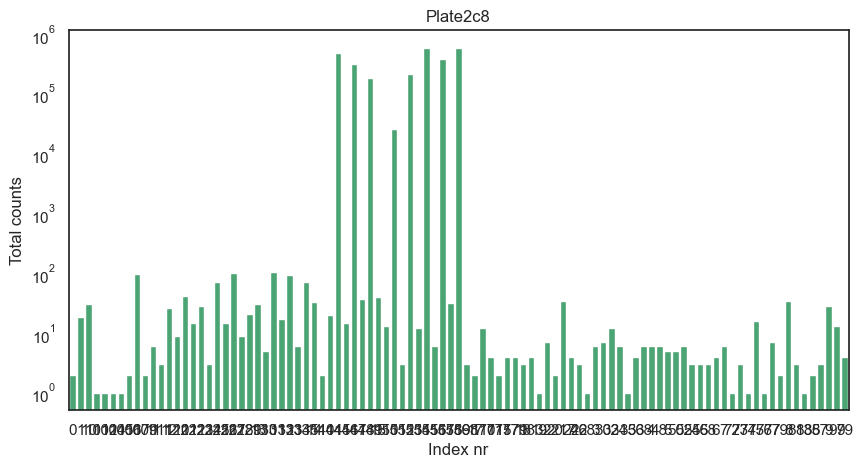

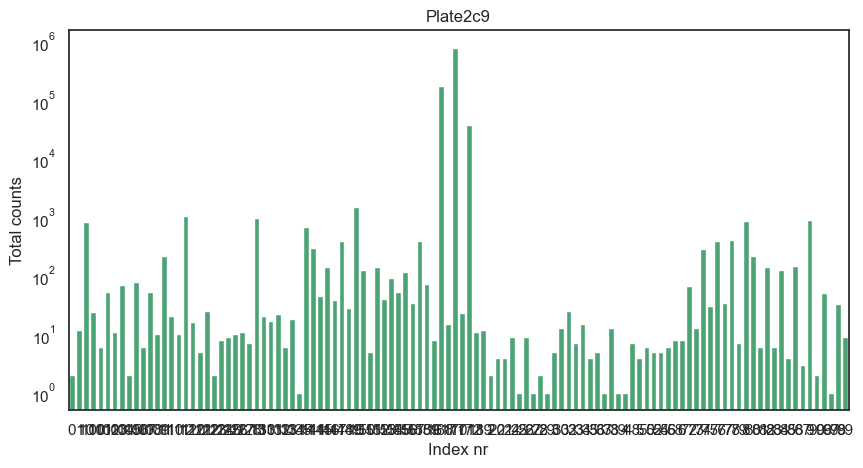

In [8]:
plotSumsPlate(plate2c1)
plotSumsPlate(plate2c2)
plotSumsPlate(plate2c3)
plotSumsPlate(plate2c4)
plotSumsPlate(plate2c5)
plotSumsPlate(plate2c6)
plotSumsPlate(plate2c7)
plotSumsPlate(plate2c8)
plotSumsPlate(plate2c9)

<AxesSubplot:title={'center':'Plate3c3'}, xlabel='Index nr', ylabel='Total counts'>

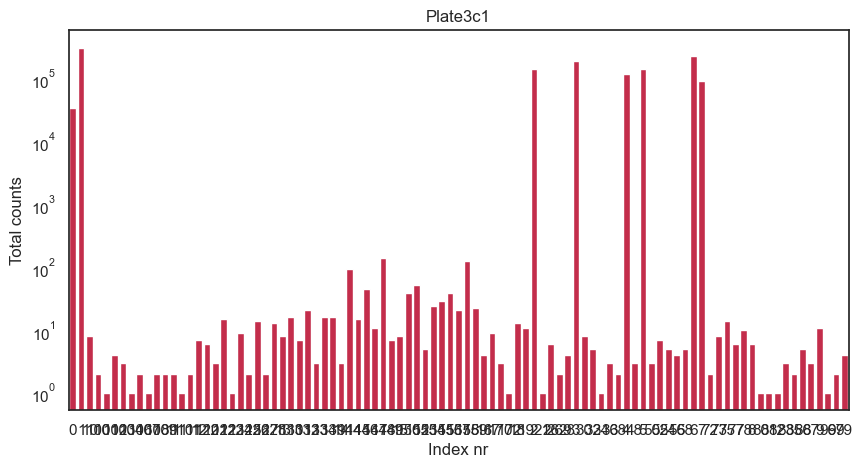

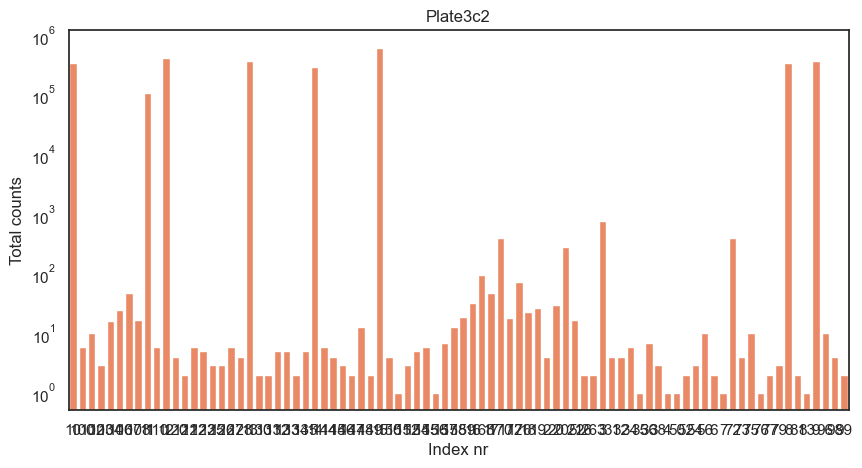

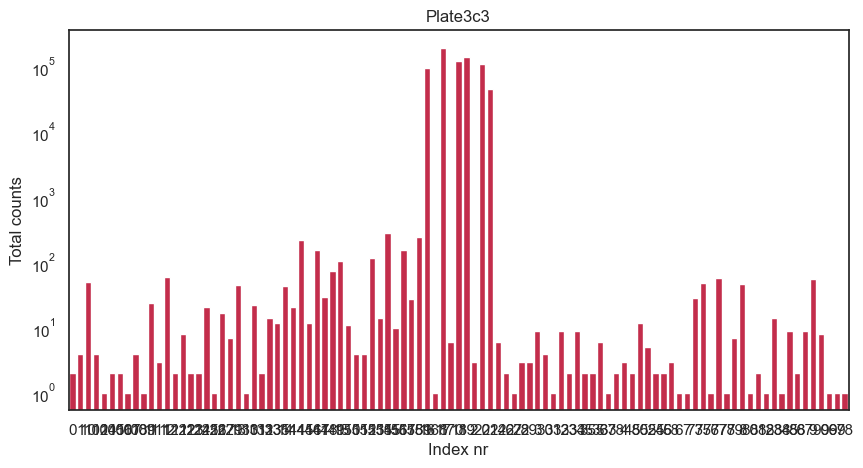

In [9]:
plotSumsPlate(plate3c1, 'crimson')
plotSumsPlate(plate3c2, 'coral')
plotSumsPlate(plate3c3, 'crimson')

### Overview of index numbers for each plate

## !!! NLA barcodes start at 0 !!!
#### This means that A1 ~ 0, B1 ~ 24, etc.

#### Plate 1
Left: The position of the NLA barcode in the plate that was used to barcode the corresponding sample. Second table: the number as used in the sequenced data for the corresponding sample.
rows/columns | 1 | 2 | 3 
---|---|---|---
**A** | B1 | B2 | C1  
**B** | B3 | B4 | C3   
**C** | B5 | B6 | C5   
**D** | B7 | B8 | C7   
**E** | B9 | B10 | C9
**F** | B11 | B12 | C11 
**G** | B13 | B14 | 
**H** | B15 | B16 |

 numbers | 1 | 2 | 3
---|---|---|---
**A** | 24 | 25 | 48
**B** | 26 | 27 | 50
**C** | 28 | 29 | 52
**D** | 30 | 31 | 54
**E** | 32 | 33 | 56
**F** | 34 | 35 | 58
**G** | 36 | 37 | 
**H** | 38 | 39 |

#### Plate 2
Left: The number of the NLA barcode in the plate that was used to barcode the corresponding sample. Second table: the number as used in the sequenced data for the corresponding sample.
rows/columns | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 
---|---|---|---|---|---|---|---|---|---
**A** | D1 | D2 | E1 | E2 | F1 | F2 | G1 | G2 | H1
**B** | D3 | D4 | E3 | E4 | F3 | F4 | G3 | G4 | H3
**C** | D5 | D6 | E5 | E6 | F5 | F6 | G5 | G6 | H5
**D** | D7 | D8 | E7 | E8 | F7 | F8 | G7 | G8 
**E** | D9 | D10| E9 | E10| F9 | F10| G9 | G10 
**F** | D11| D12| E11| E12| F11| F12| G11| G12
**G** | D13| D14| E13| E14| F13| F14| G13| G14
**H** | D15| D16| E15| E16| F15| F16| G15| G16 

numbers | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9
---|---|---|---|---|---|---|---|---|---
**A** | 72 | 73 | 96 | 97  | 120 | 121 | 144 | 145 | 168
**B** | 74 | 75 | 98 | 99  | 122 | 123 | 146 | 147 | 170
**C** | 76 | 77 | 100| 101 | 124 | 125 | 148 | 149 | 172
**D** | 78 | 79 | 102| 103 | 126 | 127 | 150 | 151
**E** | 80 | 81 | 104| 105 | 128 | 129 | 152 | 153
**F** | 82 | 83 | 106| 107 | 130 | 131 | 154 | 155
**G** | 84 | 85 | 108| 109 | 132 | 133 | 156 | 157
**H** | 86 | 87 | 110| 111 | 134 | 135 | 158 | 159


#### Plate 3
Left: The number of the NLA barcode in the plate that was used to barcode the corresponding sample. Second table: the number as used in the sequenced data for the corresponding sample.
rows/columns | 1 | 2 | 3 
---|---|---|---
**A** | A1 | A9 | A17 
**B** | A2 | A10 | A18
**C** | A3 | A11 | A19
**D** | A4 | A12 | A20
**E** | A5 | A13 | A21
**F** | A6 | A14 | A22
**G** | A7 | A15 
**H** | A8 | A16 

numbers | 1 | 2 | 3
---|---|---|---
**A** | 0 | 8 | 16
**B** | 1 | 9 | 17
**C** | 2 | 10 | 18
**D** | 3 | 11 | 19
**E** | 4 | 12 | 20
**F** | 5 | 13 | 21
**G** | 6 | 14 | 
**H** | 7 | 15 | 

In [10]:
# check percentage of reads with correct scar barcode
print('Plate 1 c1: ' + str(plate1c1['1c1'][['24','26','28','30','32','34','36','38']].sum().sum()/plate1c1.sum().sum()*100) + ' %')
print('Plate 1 c2: ' + str(plate1c2['1c2'][['25','27','29','31','33','35','37','39']].sum().sum()/plate1c2.sum().sum()*100) + ' %')
print('Plate 1 c3: ' + str(plate1c3['1c3'][['48','50','52','54','56','58']].sum().sum()/plate1c3.sum().sum()*100) + ' %')

print('\n')

print('Plate 2 c1: ' + str(plate2c1['2c1'][['72','74','76','78','80','82','84','86']].sum().sum()/plate2c1.sum().sum()*100) + ' %')
print('Plate 2 c2: ' + str(plate2c2['2c2'][['73','75','77','79','81','83','85', '87']].sum().sum()/plate2c2.sum().sum()*100) + ' %')
print('Plate 2 c3: ' + str(plate2c3['2c3'][['96','98','100','102','104','106','108','110']].sum().sum()/plate2c3.sum().sum()*100) + ' %')
print('Plate 2 c4: ' + str(plate2c4['2c4'][['97','99','101','103','105','107','109','111']].sum().sum()/plate2c4.sum().sum()*100) + ' %')
print('Plate 2 c5: ' + str(plate2c5['2c5'][['120','122','124','126','128','130','132','134']].sum().sum()/plate2c5.sum().sum()*100) + ' %')
print('Plate 2 c6: ' + str(plate2c6['2c6'][['121','123','125','127','129','131','133','135']].sum().sum()/plate2c6.sum().sum()*100) + ' %')
print('Plate 2 c7: ' + str(plate2c7['2c7'][['144','146','148','150','152','154','156','158']].sum().sum()/plate2c7.sum().sum()*100) + ' %')
print('Plate 2 c8: ' + str(plate2c8['2c8'][['145','147','149','151','153','155','157','159']].sum().sum()/plate2c8.sum().sum()*100) + ' %')
print('Plate 2 c9: ' + str(plate2c9['2c9'][['168','170','172']].sum().sum()/plate2c9.sum().sum()*100) + ' %')

print('\n')

print('Plate 3 c1: ' + str(plate3c1['3c1'][['0','1','2','3','4','5','6','7']].sum().sum()/plate3c1.sum().sum()*100) + ' %')
print('Plate 3 c2: ' + str(plate3c2['3c2'][['8','9','10','11','12','13','14','15']].sum().sum()/plate3c2.sum().sum()*100) + ' %')
print('Plate 3 c3: ' + str(plate3c3['3c3'][['16','17','18','19','20','21']].sum().sum()/plate3c3.sum().sum()*100) + ' %')






Plate 1 c1: 99.92111865258462 %
Plate 1 c2: 96.61281280802574 %
Plate 1 c3: 99.90910927561035 %


Plate 2 c1: 99.77746254782971 %
Plate 2 c2: 99.81788107223059 %
Plate 2 c3: 99.93797741169631 %
Plate 2 c4: 99.88691329557557 %
Plate 2 c5: 99.89975823068539 %
Plate 2 c6: 99.95056905273778 %
Plate 2 c7: 99.97922998321216 %
Plate 2 c8: 99.9519060476988 %
Plate 2 c9: 98.83395848494368 %


Plate 3 c1: 99.91773297585797 %
Plate 3 c2: 99.91071425494647 %
Plate 3 c3: 99.68350379584447 %


Now we can merge all samples together into one dataframe 'df', dropping per sample all reads with the incorrect scar barcode.

In [11]:
dfs_all = [plate1c1['1c1'][['24','26','28','30','32','34','36','38']],
           plate1c2['1c2'][['25','27','29','31','33','35','37','39']],
           plate1c3['1c3'][['48','50','52','54','56','58']],
           plate2c1['2c1'][['72','74','76','78','80','82','84','86']],
           plate2c2['2c2'][['73','75','77','79','81','83','85', '87']],
           plate2c3['2c3'][['96','98','100','102','104','106','108','110']],
           plate2c4['2c4'][['97','99','101','103','105','107','109','111']],
           plate2c5['2c5'][['120','122','124','126','128','130','132','134']],
           plate2c6['2c6'][['121','123','125','127','129','131','133','135']],
           plate2c7['2c7'][['144','146','148','150','152','154','156','158']],
           plate2c8['2c8'][['145','147','149','151','153','155','157','159']],
           plate2c9['2c9'][['168','170','172']],
           plate3c1['3c1'][['0','1','2','3','4','5','6','7']],
           plate3c2['3c2'][['8','9','10','11','12','13','14','15']],
           plate3c3['3c3'][['16','17','18','19','20','21']]       
          ]

df = dfs_all[0].join(dfs_all[1:],how='outer')

In [12]:
df.head()

24    26    28    30     32    34  \
allele       chrom bin_start bin_end                                        
129P2_OlaHsd 1     3000000   3250000  22.0  20.0  10.0  24.0   34.0  17.0   
                   3250000   3500000  22.0  14.0  10.0  30.0   58.0  26.0   
None         1     3250000   3500000  42.0  31.0  36.0  44.0   97.0  34.0   
                   3500000   3750000  80.0  31.0  35.0  67.0  127.0  75.0   
                   3750000   4000000  64.0  40.0  42.0  44.0   84.0  48.0   

                                        36     38   25   27  ...    12    13  \
allele       chrom bin_start bin_end                         ...               
129P2_OlaHsd 1     3000000   3250000  16.0   32.0  NaN  NaN  ...   NaN   NaN   
                   3250000   3500000  26.0   40.0  NaN  2.0  ...   6.0  16.0   
None         1     3250000   3500000  32.0   61.0  2.0  NaN  ...  44.0  43.0   
                   3500000   3750000  58.0  104.0  NaN  4.0  ...  39.0  37.0   
                   3750000   4000000  38.0  103.0  4.0  4.0  ...  50.0  38.0   

                                        14    15    16    17    18    19  \
allele       chrom bin_start bin_end                                       
129P2_OlaHsd 1     3000000   3250000   NaN   NaN  10.0   NaN  10.0   8.0   
                   3250000   3500000   8.0  32.0   6.0   4.0   8.0   8.0   
None         1     3250000   3500000  21.0  55.0   6.0  10.0  12.0  16.0   
                   3500000   3750000  35.0  80.0  16.0  37.0  19.0  16.0   
                   3750000   4000000  38.0  86.0  27.0  18.0   9.0   9.0   

                                        20    21  
allele       chrom bin_start bin_end              
129P2_OlaHsd 1     3000000   3250000   4.0   2.0  
                   3250000   3500000   8.0   NaN  
None         1     3250000   3500000   6.0   4.0  
                   3500000   3750000  13.0  10.0  
                   3750000   4000000   7.0   2.0  

[5 rows x 111 columns]

Now that we have selected the reads with the correct NLA barcode, we can plot the total counts of the final dataframe

### Overview of index numbers and corresponding clonal line for each plate

#### Plate 1
numbers | 1 | 2 | 3
---|---|---|---
**A** | 24 | 25 | 48
**B** | 26 | 27 | 50
**C** | 28 | 29 | 52
**D** | 30 | 31 | 54
**E** | 32 | 33 | 56
**F** | 34 | 35 | 58
**G** | 36 | 37 | 
**H** | 38 | 39 |

clones | 1 | 2 | 3
---|---|---|---
**A** | WT1 | H55 | L14
**B** | HH1 | H56 | L21
**C** | H19 | H58 | L26
**D** | H21 | L1 | L28
**E** | H26 | L3 | L31
**F** | H34 | L4 | L41
**G** | H44 | L7 | 
**H** | H51 | L9 | 


#### Plate 2
numbers | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9
---|---|---|---|---|---|---|---|---|---
**A** | 72 | 73 | 96 | 97  | 120 | 121 | 144 | 145 | 168
**B** | 74 | 75 | 98 | 99  | 122 | 123 | 146 | 147 | 170
**C** | 76 | 77 | 100| 101 | 124 | 125 | 148 | 149 | 172
**D** | 78 | 79 | 102| 103 | 126 | 127 | 150 | 151
**E** | 80 | 81 | 104| 105 | 128 | 129 | 152 | 153
**F** | 82 | 83 | 106| 107 | 130 | 131 | 154 | 155
**G** | 84 | 85 | 108| 109 | 132 | 133 | 156 | 157
**H** | 86 | 87 | 110| 111 | 134 | 135 | 158 | 159

clones | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9
---|---|---|---|---|---|---|---|---|---
**A** | WT2| L13 | L27 | L44 | H2 | H15 | H31 | H52 | H81
**B** | HH2| L15 | L29 | L45 | H4 | H18 | H41 | H53 | HH2b
**C** | L2 | L16 | L33 | L49 | H5 | H20 | H42 | H54 | L5b
**D** | L5 | L18 | L35 | L50 | H10| H22 | H43 | H67 | 
**E** | L6 | L19 | L36 | L54 | H11| H23 | H45 | H71 | 
**F** | L8 | L22 | L38 | L63 | H12| H24 | H46 | H72 |
**G** | L10| L23 | L39 | L64 | H13| H28 | H47 | H79 | 
**H** | L12| L24 | L42 | L65 | H14| H30 | H49 | H80 | 


#### Plate 3
numbers | 1 | 2 | 3
---|---|---|---
**A** | 0 | 8 | 16
**B** | 1 | 9 | 17
**C** | 2 | 10 | 18
**D** | 3 | 11 | 19
**E** | 4 | 12 | 20
**F** | 5 | 13 | 21
**G** | 6 | 14 | 
**H** | 7 | 15 | 

clones | 1 | 2 | 3
---|---|---|---
**A** | WT3 | L11 | L66
**B** | HH3 | L17 | L67
**C** | H1 | L30 | L68
**D** | H39 | L43 | L75
**E** | H59 | L46 | L76
**F** | H68 | L47 | L78
**G** | H76 | L51 | 
**H** | H92 | L56 | 


In [13]:
numbersToClones = {
    '24':'WT1','26':'HH1','28':'H19','30':'H21','32':'H26','34':'H34','36':'H44','38':'H51',
    '25':'H55','27':'H56','29':'H58','31':'L1','33':'L3','35':'L4','37':'L7','39':'L9',
    '48':'L14','50':'L21','52':'L26','54':'L28','56':'L31','58':'L41',
    
    '72':'WT2','74':'HH2','76':'L2','78':'L5','80':'L6','82':'L8','84':'L10','86':'L12',
    '73':'L13','75':'L15','77':'L16','79':'L18','81':'L19','83':'L22','85':'L23','87':'L24',
    '96':'L27','98':'L29','100':'L33','102':'L35','104':'L36','106':'L38','108':'L39','110':'L42',
    '97':'L44','99':'L45','101':'L49','103':'L50','105':'L54','107':'L63','109':'L64','111':'L65',
    '120':'H2','122':'H4','124':'H5','126':'H10','128':'H11','130':'H12','132':'H13','134':'H14',
    '121':'H15','123':'H18','125':'H20','127':'H22','129':'H23','131':'H24','133':'H28','135':'H30',
    '144':'H31','146':'H41','148':'H42','150':'H43','152':'H45','154':'H46','156':'H47','158':'H49',
    '145':'H52','147':'H53','149':'H54','151':'H67','153':'H71','155':'H72','157':'H79','159':'H80', 
    '168':'H81', '170':'HH2b', '172':'L5b',
        
    '0':'WT3','1':'HH3','2':'H1','3':'H39','4':'H59','5':'H68','6':'H76','7':'H92',
    '8':'L11','9':'L17','10':'L30','11':'L43','12':'L46','13':'L47','14':'L51','15':'L56',
    '16':'L66','17':'L67','18':'L68','19':'L75','20':'L76','21':'L78'}     

In [14]:
df.columns = df.columns.to_series().map(numbersToClones)
df.head()

WT1   HH1   H19   H21    H26   H34  \
allele       chrom bin_start bin_end                                        
129P2_OlaHsd 1     3000000   3250000  22.0  20.0  10.0  24.0   34.0  17.0   
                   3250000   3500000  22.0  14.0  10.0  30.0   58.0  26.0   
None         1     3250000   3500000  42.0  31.0  36.0  44.0   97.0  34.0   
                   3500000   3750000  80.0  31.0  35.0  67.0  127.0  75.0   
                   3750000   4000000  64.0  40.0  42.0  44.0   84.0  48.0   

                                       H44    H51  H55  H56  ...   L46   L47  \
allele       chrom bin_start bin_end                         ...               
129P2_OlaHsd 1     3000000   3250000  16.0   32.0  NaN  NaN  ...   NaN   NaN   
                   3250000   3500000  26.0   40.0  NaN  2.0  ...   6.0  16.0   
None         1     3250000   3500000  32.0   61.0  2.0  NaN  ...  44.0  43.0   
                   3500000   3750000  58.0  104.0  NaN  4.0  ...  39.0  37.0   
                   3750000   4000000  38.0  103.0  4.0  4.0  ...  50.0  38.0   

                                       L51   L56   L66   L67   L68   L75  \
allele       chrom bin_start bin_end                                       
129P2_OlaHsd 1     3000000   3250000   NaN   NaN  10.0   NaN  10.0   8.0   
                   3250000   3500000   8.0  32.0   6.0   4.0   8.0   8.0   
None         1     3250000   3500000  21.0  55.0   6.0  10.0  12.0  16.0   
                   3500000   3750000  35.0  80.0  16.0  37.0  19.0  16.0   
                   3750000   4000000  38.0  86.0  27.0  18.0   9.0   9.0   

                                       L76   L78  
allele       chrom bin_start bin_end              
129P2_OlaHsd 1     3000000   3250000   4.0   2.0  
                   3250000   3500000   8.0   NaN  
None         1     3250000   3500000   6.0   4.0  
                   3500000   3750000  13.0  10.0  
                   3750000   4000000   7.0   2.0  

[5 rows x 111 columns]

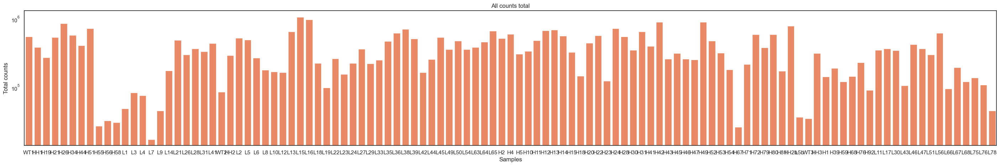

In [15]:
#selected
sums_cells_df = df.sum(axis=0)

sns.set(style="white")
plt.figure(figsize=(35,5))
ax = sns.barplot(x=sums_cells_df.index, y=sums_cells_df,color='coral', log='y')
ax.set_title('All counts total')
ax.set(xlabel='Samples', ylabel='Total counts')
plt.show()

# Check counts per allele

In [16]:
df.index.levels[0]

Index(['129P2_OlaHsd', 'C57BL_6NJ', 'None'], dtype='object', name='allele')

In [17]:
df_129 = df.loc['129P2_OlaHsd']
df_B6 = df.loc['C57BL_6NJ']
nonallelic = df.drop(['C57BL_6NJ','129P2_OlaHsd'])


sums_cells_all = df.sum(axis=0)
sums_cells_B6 = df_B6.sum(axis=0)
sums_cells_129 = df_129.sum(axis=0)
sums_cells_NA = nonallelic.sum(axis=0)

In [18]:
def plotAllelesperClone (df,colour='mediumseagreen',log='y'):
    sns.set(style="white")
    plt.figure(figsize=(25,5))
    ax = sns.barplot(x=df.sum(axis=0).index, y=df.sum(axis=0), color=colour, log=log)
    ax.set_title('All counts total')
    ax.set(xlabel='Samples', ylabel='Total counts')
    plt.show()

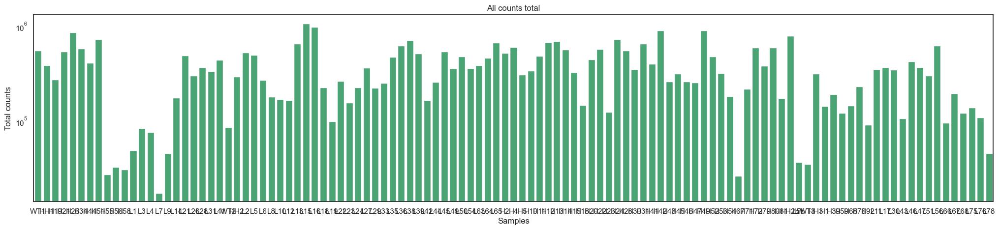

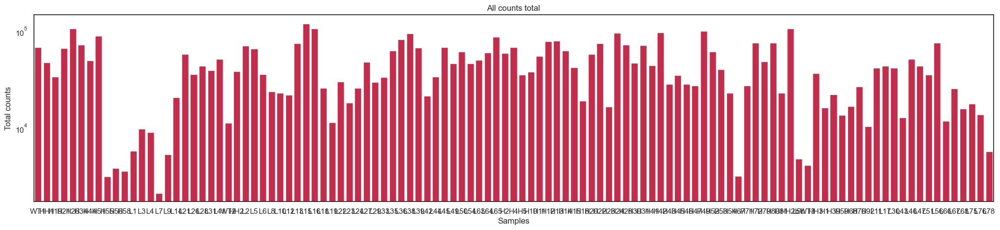

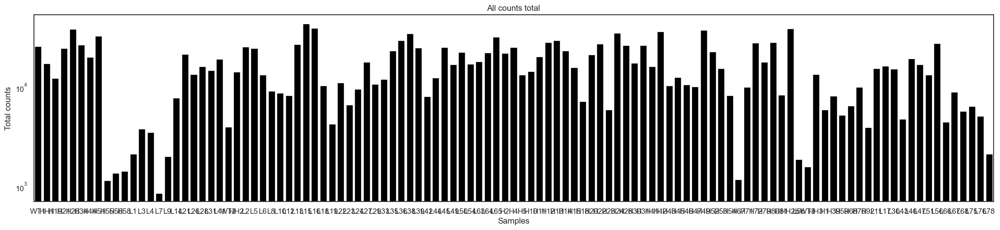

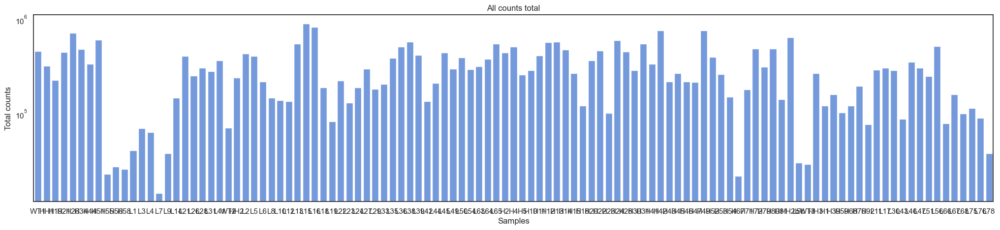

In [19]:
plotAllelesperClone(df)
plotAllelesperClone(df_129,colour='crimson')
plotAllelesperClone(df_B6,colour='black')
plotAllelesperClone(nonallelic,colour='cornflowerblue')


In [20]:
def plotRawCounts(df,title='title',palette='winter',xlabel='allele',figsize=(20,5)):
    sns.set(style="white")
    plt.figure(figsize=(figsize))
    ax = sns.barplot(x=df.index, y=df, palette=palette, log = 'y')
    #ax.set(xlabel=xlabel, ylabel='total counts')
    ax.set_xlabel(xlabel, fontsize='large')
    ax.set_ylabel('total counts', fontsize='large')
    plt.show()

In [21]:
sums_cells_chr = df.sum(axis=0, level=1)
sums_cells_allele = df.sum(axis=0, level=0)
sums_cells_chr_allele = df.sum(axis=0, level=(0,1))
sums_cells_chr = df.sum(axis=0, level=1)
sums_cells_allele = df.sum(axis=0, level=0)

countsPerAllele = sums_cells_allele.sum(axis=1)
countsPerChrom = sums_cells_chr.sum(axis=1)

In [22]:
df.head()

WT1   HH1   H19   H21    H26   H34  \
allele       chrom bin_start bin_end                                        
129P2_OlaHsd 1     3000000   3250000  22.0  20.0  10.0  24.0   34.0  17.0   
                   3250000   3500000  22.0  14.0  10.0  30.0   58.0  26.0   
None         1     3250000   3500000  42.0  31.0  36.0  44.0   97.0  34.0   
                   3500000   3750000  80.0  31.0  35.0  67.0  127.0  75.0   
                   3750000   4000000  64.0  40.0  42.0  44.0   84.0  48.0   

                                       H44    H51  H55  H56  ...   L46   L47  \
allele       chrom bin_start bin_end                         ...               
129P2_OlaHsd 1     3000000   3250000  16.0   32.0  NaN  NaN  ...   NaN   NaN   
                   3250000   3500000  26.0   40.0  NaN  2.0  ...   6.0  16.0   
None         1     3250000   3500000  32.0   61.0  2.0  NaN  ...  44.0  43.0   
                   3500000   3750000  58.0  104.0  NaN  4.0  ...  39.0  37.0   
                   3750000   4000000  38.0  103.0  4.0  4.0  ...  50.0  38.0   

                                       L51   L56   L66   L67   L68   L75  \
allele       chrom bin_start bin_end                                       
129P2_OlaHsd 1     3000000   3250000   NaN   NaN  10.0   NaN  10.0   8.0   
                   3250000   3500000   8.0  32.0   6.0   4.0   8.0   8.0   
None         1     3250000   3500000  21.0  55.0   6.0  10.0  12.0  16.0   
                   3500000   3750000  35.0  80.0  16.0  37.0  19.0  16.0   
                   3750000   4000000  38.0  86.0  27.0  18.0   9.0   9.0   

                                       L76   L78  
allele       chrom bin_start bin_end              
129P2_OlaHsd 1     3000000   3250000   4.0   2.0  
                   3250000   3500000   8.0   NaN  
None         1     3250000   3500000   6.0   4.0  
                   3500000   3750000  13.0  10.0  
                   3750000   4000000   7.0   2.0  

[5 rows x 111 columns]

In [23]:
def plotRawCounts(df,title='title',colour='mediumseagreen',xlabel='allele',figsize=(20,5)):
    sns.set(style="white")
    plt.figure(figsize=(figsize))
    ax = sns.barplot(x=df.index, y=df, color=colour, log = 'y')
    ax.set(xlabel=xlabel, ylabel='total counts')
    plt.show()

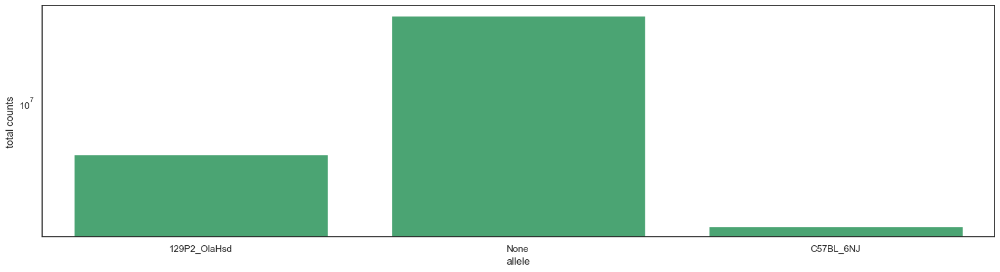

In [24]:
sums_cells = df.sum(axis=0, level=0)


counts = sums_cells.sum(axis=1)


plotRawCounts(counts)


#plotRawCounts(countsPerChrom, xlabel='chrom')


In [25]:
allelesumsforplot = pd.DataFrame(sums_cells_chr_allele.sum(axis=1)).reset_index()
allelesumsforplot['allele_chrom'] = allelesumsforplot['allele'] + '_' + allelesumsforplot['chrom']
allelesumsforplot

,allele,chrom,0,allele_chrom
0,129P2_OlaHsd,1,583563.0,129P2_OlaHsd_1
1,None,1,3554085.0,None_1
2,C57BL_6NJ,1,168171.0,C57BL_6NJ_1
3,129P2_OlaHsd,10,121910.0,129P2_OlaHsd_10
4,None,10,1798233.0,None_10
...,...,...,...,...
58,C57BL_6NJ,X,24160.0,C57BL_6NJ_X
59,129P2_OlaHsd,X,476.0,129P2_OlaHsd_X
60,None,Y,20830.0,None_Y
61,129P2_OlaHsd,Y,163.0,129P2_OlaHsd_Y


In [26]:
def plotRawalleleCounts(df,title='title',colour='mediumseagreen',xlabel='allele',figsize=(20,5)):
    sns.set(style="white")
    plt.figure(figsize=(figsize))
    ax = sns.barplot(x=df['allele_chrom'], y=df[0], color=colour, log = 'y')
    ax.set(xlabel=xlabel, ylabel='total counts')
    plt.show()

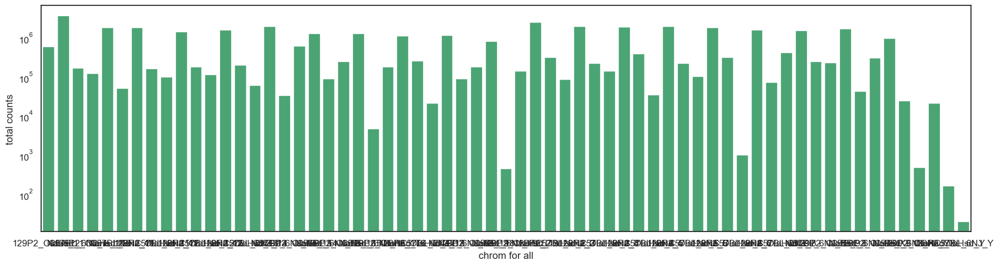

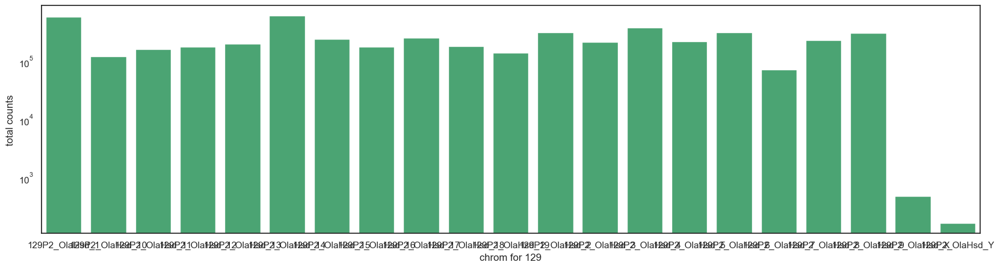

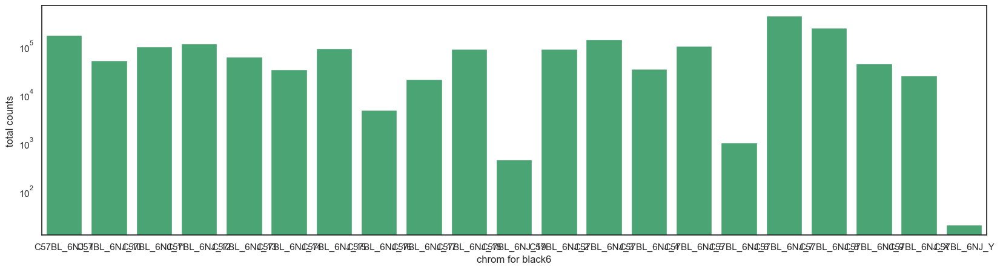

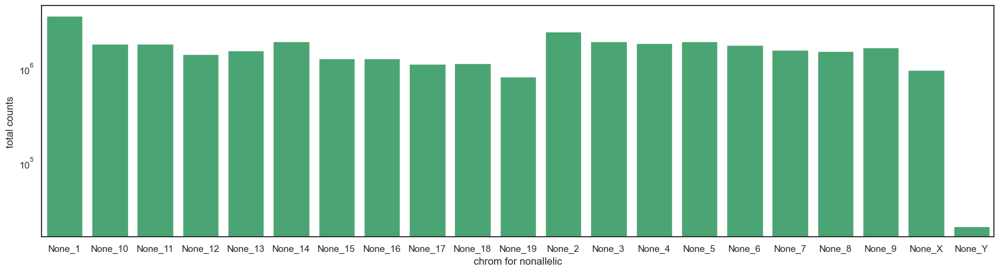

In [27]:
plotRawalleleCounts(allelesumsforplot, xlabel='chrom for all')
plotRawalleleCounts(allelesumsforplot[allelesumsforplot['allele'] == '129P2_OlaHsd'], xlabel='chrom for 129')
plotRawalleleCounts(allelesumsforplot[allelesumsforplot['allele'] == 'C57BL_6NJ'], xlabel='chrom for black6')
plotRawalleleCounts(allelesumsforplot[allelesumsforplot['allele'] == 'None'], xlabel='chrom for nonallelic')


In [28]:
def plotAlleleCountsPerSampleLOG (sample):
    fig, axes = plt.subplots(1, 4, figsize=(20,4))
    fig.suptitle(sample + ' LOG')
    sns.barplot(x=sums_cells_chr_allele[sample]['129P2_OlaHsd'].index, y=sums_cells_chr_allele[sample]['129P2_OlaHsd'], ax=axes[0], log = 'y', color='crimson')
    sns.barplot(x=sums_cells_chr_allele[sample]['C57BL_6NJ'].index, y=sums_cells_chr_allele[sample]['C57BL_6NJ'], ax=axes[1], log = 'y', color='black')
    sns.barplot(x=sums_cells_chr_allele[sample]['None'].index, y=sums_cells_chr_allele[sample]['None'], ax=axes[2], log = 'y',color='cornflowerblue')
    sns.barplot(x=sums_cells_chr[sample].index, y=sums_cells_chr[sample], ax=axes[3], color='mediumseagreen')
    
def plotAlleleCountsPerSample (sample):
    fig, axes = plt.subplots(1, 4, figsize=(20,4))
    fig.suptitle(sample)
    sns.barplot(x=sums_cells_chr_allele[sample]['129P2_OlaHsd'].index, y=sums_cells_chr_allele[sample]['129P2_OlaHsd'], ax=axes[0], color='crimson')
    sns.barplot(x=sums_cells_chr_allele[sample]['C57BL_6NJ'].index, y=sums_cells_chr_allele[sample]['C57BL_6NJ'], ax=axes[1], color='black')
    sns.barplot(x=sums_cells_chr_allele[sample]['None'].index, y=sums_cells_chr_allele[sample]['None'], ax=axes[2], color='cornflowerblue')
    sns.barplot(x=sums_cells_chr[sample].index, y=sums_cells_chr[sample], ax=axes[3], color='mediumseagreen')





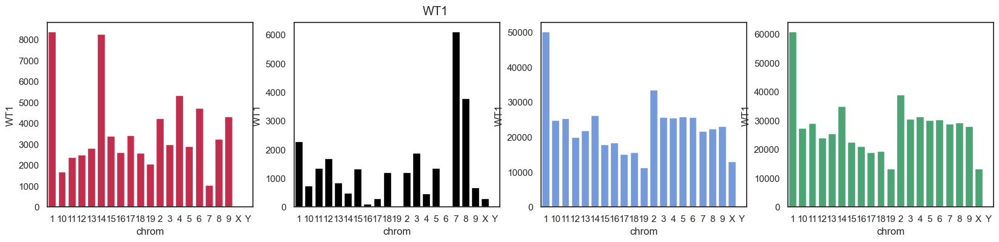

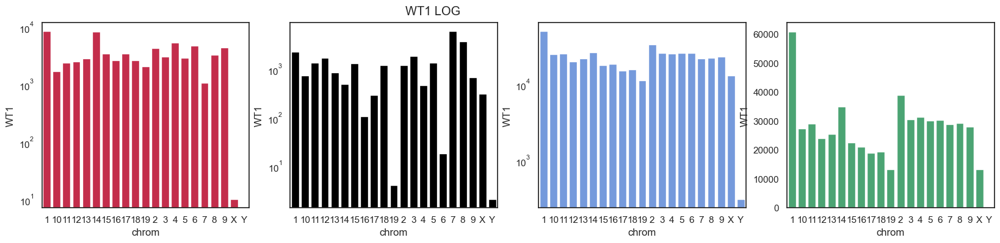

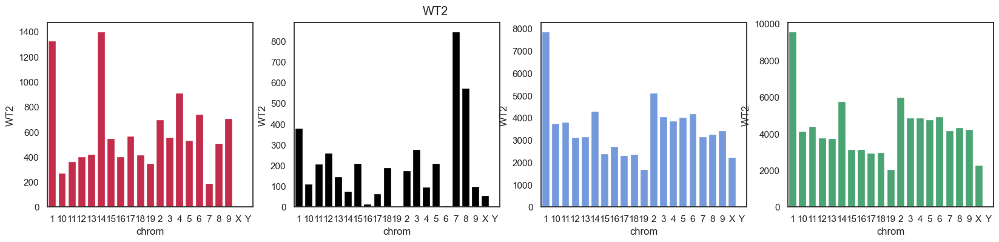

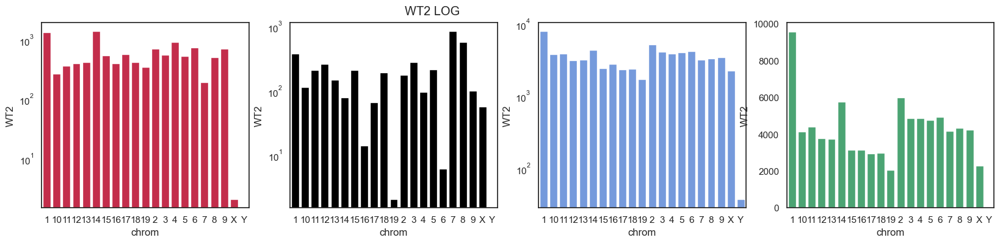

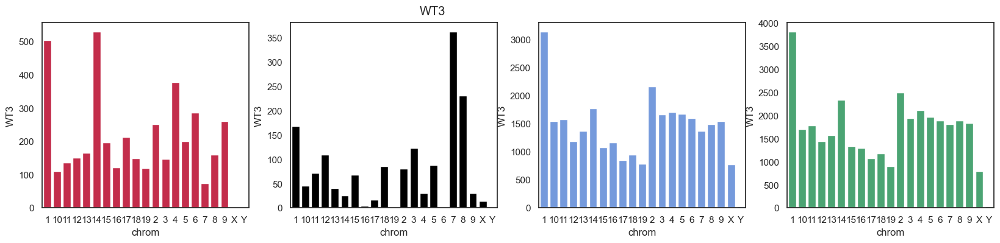

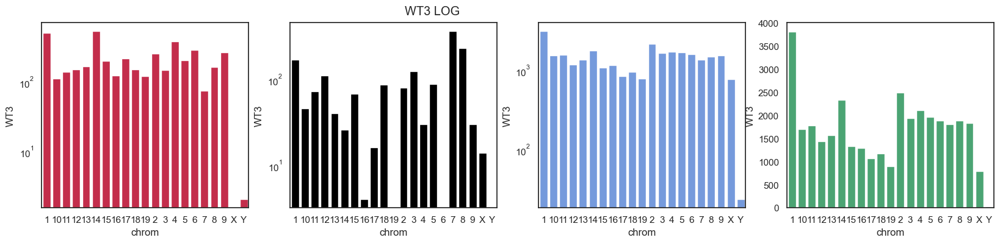

In [29]:
plotAlleleCountsPerSample('WT1')
plotAlleleCountsPerSampleLOG('WT1')
plotAlleleCountsPerSample('WT2')
plotAlleleCountsPerSampleLOG('WT2')
plotAlleleCountsPerSample('WT3')
plotAlleleCountsPerSampleLOG('WT3')

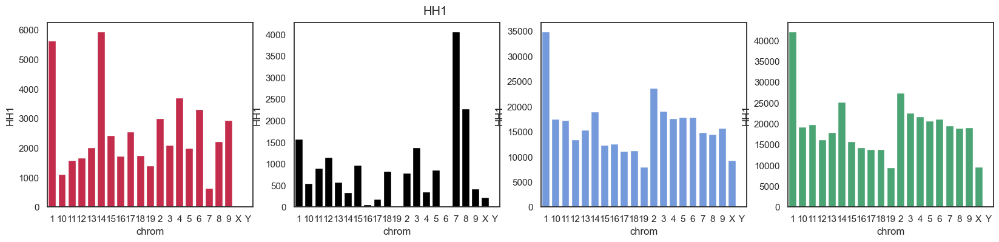

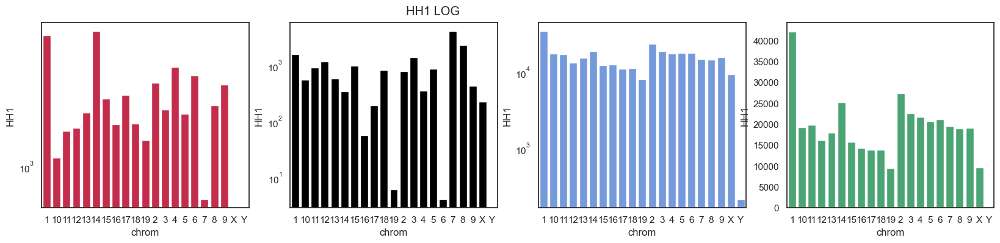

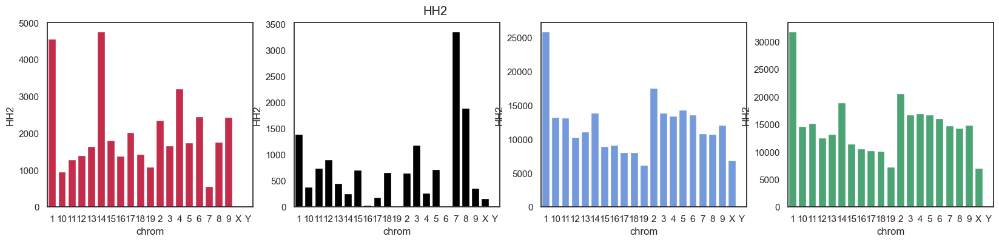

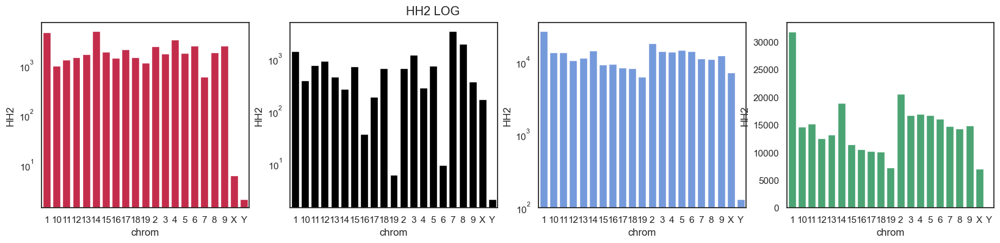

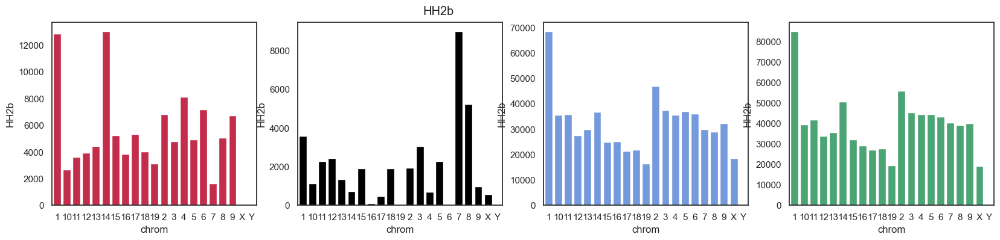

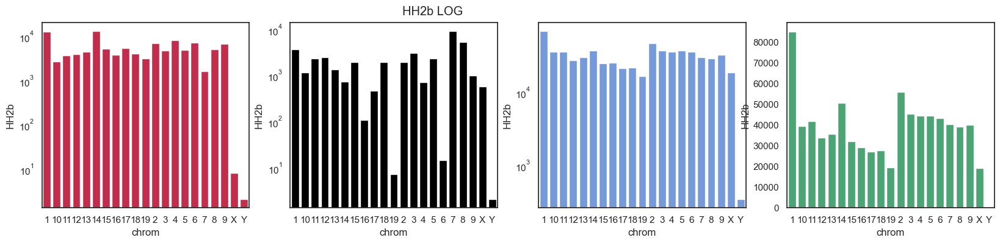

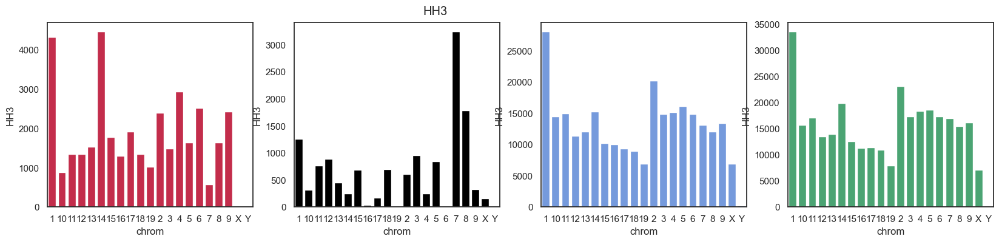

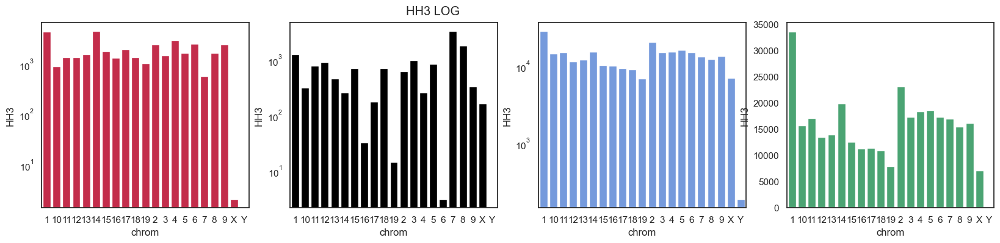

In [30]:
plotAlleleCountsPerSample('HH1')
plotAlleleCountsPerSampleLOG('HH1')
plotAlleleCountsPerSample('HH2')
plotAlleleCountsPerSampleLOG('HH2')
plotAlleleCountsPerSample('HH2b')
plotAlleleCountsPerSampleLOG('HH2b')
plotAlleleCountsPerSample('HH3')
plotAlleleCountsPerSampleLOG('HH3')

In [31]:
df2 = df.copy()
def map_level(df, dct, level=0):
    index = df.index
    index.set_levels([[dct.get(item, item) for item in names] if i==level else names
                      for i, names in enumerate(index.levels)], inplace=True)

dct = {'1':'01', '2':'02','3':'03', '4':'04','5':'05', '6':'06','7':'07', '8':'08','9':'09'}

map_level(df2, dct, level=1)
df2 = df2.sort_values(by='chrom', ascending = True)
df2

WT1   HH1   H19   H21   H26   H34  \
allele       chrom bin_start bin_end                                         
129P2_OlaHsd 01    3000000   3250000    22.0  20.0  10.0  24.0  34.0  17.0   
None         01    173000000 173250000  38.0  16.0  20.0  26.0  42.0  26.0   
129P2_OlaHsd 01    173000000 173250000  26.0  12.0  16.0  34.0  50.0  36.0   
C57BL_6NJ    01    172750000 173000000  22.0  20.0   6.0  16.0  30.0  24.0   
129P2_OlaHsd 01    172750000 173000000  48.0  22.0  30.0  32.0  58.0  40.0   
...                                      ...   ...   ...   ...   ...   ...   
None         Y     86000000  86250000    4.0   NaN   NaN   NaN   NaN   NaN   
                   84750000  85000000    NaN   NaN   NaN   NaN   NaN   NaN   
                   84000000  84250000    NaN   NaN   NaN   NaN   NaN   2.0   
                   49250000  49500000    NaN   NaN   NaN   NaN   NaN   NaN   
                   53500000  53750000    NaN   NaN   NaN   NaN   NaN   NaN   

                                         H44   H51  H55  H56  ...   L46   L47  \
allele       chrom bin_start bin_end                          ...               
129P2_OlaHsd 01    3000000   3250000    16.0  32.0  NaN  NaN  ...   NaN   NaN   
None         01    173000000 173250000  26.0  41.0  2.0  2.0  ...  20.0  30.0   
129P2_OlaHsd 01    173000000 173250000  10.0  30.0  NaN  NaN  ...  24.0  14.0   
C57BL_6NJ    01    172750000 173000000   6.0  26.0  NaN  NaN  ...  24.0   4.0   
129P2_OlaHsd 01    172750000 173000000  28.0  66.0  NaN  2.0  ...  22.0  14.0   
...                                      ...   ...  ...  ...  ...   ...   ...   
None         Y     86000000  86250000    NaN   2.0  NaN  NaN  ...   NaN   NaN   
                   84750000  85000000    NaN   2.0  NaN  NaN  ...   NaN   NaN   
                   84000000  84250000    NaN   2.0  NaN  NaN  ...   NaN   NaN   
                   49250000  49500000    NaN   NaN  NaN  NaN  ...   NaN   NaN   
                   53500000  53750000    NaN   NaN  NaN  NaN  ...   NaN   NaN   

                                         L51   L56   L66   L67   L68   L75  \
allele       chrom bin_start bin_end                                         
129P2_OlaHsd 01    3000000   3250000     NaN   NaN  10.0   NaN  10.0   8.0   
None         01    173000000 173250000  12.0  43.0   2.0   7.0   9.0   4.0   
129P2_OlaHsd 01    173000000 173250000  16.0  20.0   8.0  16.0   NaN   6.0   
C57BL_6NJ    01    172750000 173000000  10.0  24.0   2.0  12.0   4.0   4.0   
129P2_OlaHsd 01    172750000 173000000  20.0  26.0  12.0  20.0   8.0  10.0   
...                                      ...   ...   ...   ...   ...   ...   
None         Y     86000000  86250000    NaN   NaN   NaN   NaN   NaN   NaN   
                   84750000  85000000    2.0   2.0   NaN   NaN   NaN   NaN   
                   84000000  84250000    1.0   NaN   NaN   NaN   NaN   NaN   
                   49250000  49500000    NaN   NaN   NaN   NaN   NaN   NaN   
                   53500000  53750000    NaN   NaN   NaN   NaN   NaN   NaN   

                                         L76  L78  
allele       chrom bin_start bin_end               
129P2_OlaHsd 01    3000000   3250000     4.0  2.0  
None         01    173000000 173250000   6.0  2.0  
129P2_OlaHsd 01    173000000 173250000   NaN  NaN  
C57BL_6NJ    01    172750000 173000000   2.0  NaN  
129P2_OlaHsd 01    172750000 173000000  16.0  NaN  
...                                      ...  ...  
None         Y     86000000  86250000    NaN  NaN  
                   84750000  85000000    NaN  NaN  
                   84000000  84250000    NaN  NaN  
                   49250000  49500000    NaN  NaN  
                   53500000  53750000    NaN  NaN  

[24990 rows x 111 columns]

In [32]:
df_plot = pd.DataFrame(df2.sum(level=(1,2,3)).fillna(0))
df_plot = df_plot.reset_index(level=(0,1,2))
df_plot['index'] = df_plot['chrom'] + '_' + df_plot['bin_start'].astype(str)
df_plot.index = df_plot['index']
df_plot = df_plot.rename(columns = {'index':'chrom_s'})
df_plot = df_plot.sort_values(by=['chrom','bin_start'], ascending = True)

In [33]:
df_plot['bin_red'] = df_plot['bin_start']
df_plot['bin_red'] = df_plot['bin_red']/ 1000000
df_plot['bin_red'] = df_plot['bin_red'].astype(int)
df_plot['bin_red2'] = (df_plot['bin_red']/10).astype(int)
df_plot['bin_red3'] = (df_plot['bin_red2']/4).astype(int)
df_plot['axis_red'] = df_plot['chrom'] + '_' + df_plot['bin_red'].astype(str)
df_plot['axis_red2'] = df_plot['chrom'] + '_' + df_plot['bin_red2'].astype(str)
df_plot['axis_red3'] = df_plot['chrom'] + '_' + df_plot['bin_red3'].astype(str)

df_plot

,chrom,bin_start,bin_end,WT1,HH1,H19,H21,H26,H34,H44,...,L75,L76,L78,chrom_s,bin_red,bin_red2,bin_red3,axis_red,axis_red2,axis_red3
index,,,,,,,,,,,,,,,,,,,,,
01_3000000,01,3000000,3250000,22.0,20.0,10.0,24.0,34.0,17.0,16.0,...,8.0,4.0,2.0,01_3000000,3,0,0,01_3,01_0,01_0
01_3250000,01,3250000,3500000,64.0,45.0,46.0,74.0,155.0,60.0,58.0,...,24.0,14.0,4.0,01_3250000,3,0,0,01_3,01_0,01_0
01_3500000,01,3500000,3750000,82.0,31.0,35.0,67.0,133.0,79.0,58.0,...,16.0,13.0,10.0,01_3500000,3,0,0,01_3,01_0,01_0
01_3750000,01,3750000,4000000,66.0,40.0,42.0,44.0,84.0,48.0,38.0,...,9.0,7.0,2.0,01_3750000,3,0,0,01_3,01_0,01_0
01_4000000,01,4000000,4250000,66.0,42.0,31.0,48.0,104.0,75.0,37.0,...,17.0,16.0,8.0,01_4000000,4,0,0,01_4,01_0,01_0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Y_89750000,Y,89750000,90000000,1.0,0.0,0.0,4.0,2.0,2.0,0.0,...,0.0,0.0,0.0,Y_89750000,89,8,2,Y_89,Y_8,Y_2
Y_90000000,Y,90000000,90250000,2.0,2.0,0.0,4.0,2.0,0.0,0.0,...,0.0,0.0,0.0,Y_90000000,90,9,2,Y_90,Y_9,Y_2
Y_90250000,Y,90250000,90500000,2.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,Y_90250000,90,9,2,Y_90,Y_9,Y_2


In [34]:
df_plot_rescale = df_plot.copy()

for x in df_plot_rescale:
    if x.startswith('L') or x.startswith('W') or x.startswith('H'):
        df_plot_rescale[x] = df_plot_rescale[x] / df_plot_rescale[x].max() * 100

In [35]:
sc.set_figure_params(dpi=dpi, color_map = 'viridis')
sns.set_style('white')
sns.set_context("talk")
#sns.set_style('ticks')

In [36]:
def plotScatter (name, color = 'green'):
    df_plot = df2.sum(level=(1,2,3))[name].fillna(0)
    df_plot.plot(figsize = (20,3), style = '.', ms = 1, title = name, color = color)
    plt.figure()

    

In [37]:
def plotComparisonTracks(name, color = 'limegreen'):
    fig, ax = plt.subplots(figsize=(15,3))
    ax = sns.lineplot( y = gaussian_filter1d(df_plot_rescale['WT1'],sigma = 10), x = df_plot_rescale['axis_red3'], 
                      color = 'grey',alpha = 0.6, linewidth = 2, ci = 'sd',estimator = 'mean')
    ax = sns.lineplot( y = gaussian_filter1d(df_plot_rescale[name],sigma = 10), x = df_plot_rescale['axis_red3'], 
                      color = color,alpha = 0.6, linewidth = 2, ci = 'sd',estimator = 'mean')

    ax.legend([], frameon=False)
    ax.set_xticks([])
    ax.xaxis.set_major_locator(plt.MaxNLocator(10))
    #ax.set_ylim(-0.5,10)
    ax.set_ylabel("Coverage")
    ax.set_xlabel("Chromosome")
    ax.set_title(name)
    sns.despine()
    plt.show()

def plotChromosomeTracks(name, axis = 'axis_red2'):
    col = ['darkgreen', 'darkgrey','darkgreen', 'darkgrey','darkgreen', 'darkgrey', 
       'darkgreen', 'darkgrey','darkgreen', 'darkgrey','darkgreen', 'darkgrey',
       'darkgreen', 'darkgrey','darkgreen', 'darkgrey','darkgreen', 'darkgrey',
       'darkgreen', 'darkgrey','darkgreen']
    fig, ax = plt.subplots(figsize=(15,3))
    ax = sns.lineplot( y = df_plot[name], x = df_plot[axis], color = 'grey', 
                         alpha = 0.4, ci = 'sd')

    ax = sns.lineplot( y = df_plot[name], x = df_plot[axis], palette = col,
                      hue = df_plot['chrom'],ci = 'sd',
                         alpha = 1)
    ax.legend([], frameon=False)
    ax.set_xticks([])
    ax.xaxis.set_major_locator(plt.MaxNLocator(10))
    #ax.set_ylim(-0.5,10)
    ax.set_ylabel("Coverage")
    ax.set_xlabel("Chromosome")
    ax.set_title(name)
    sns.despine()
    plt.show()

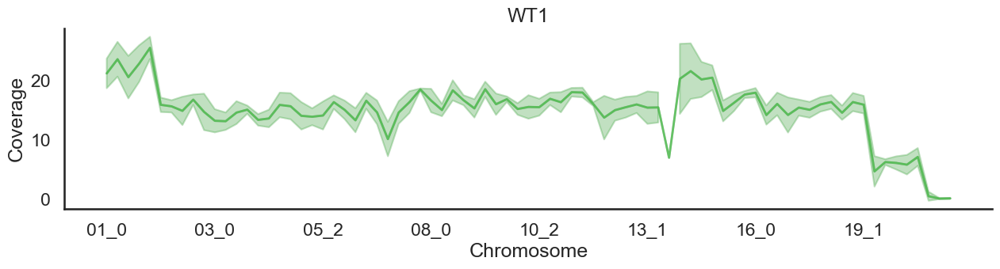

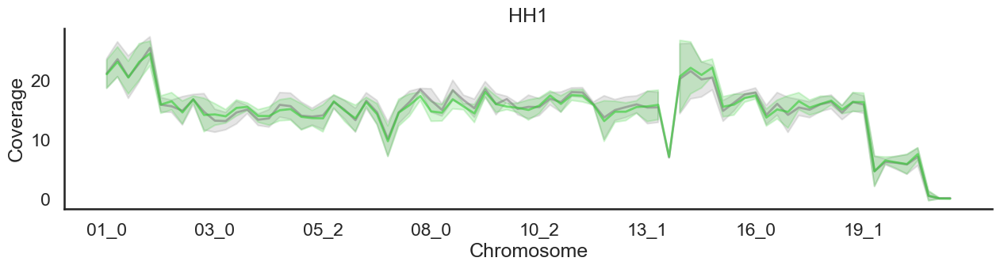

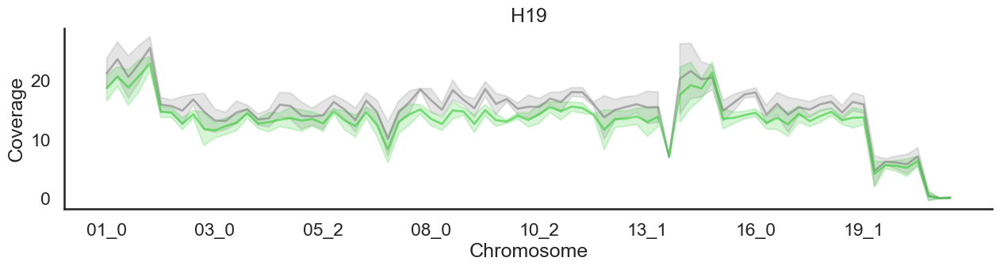

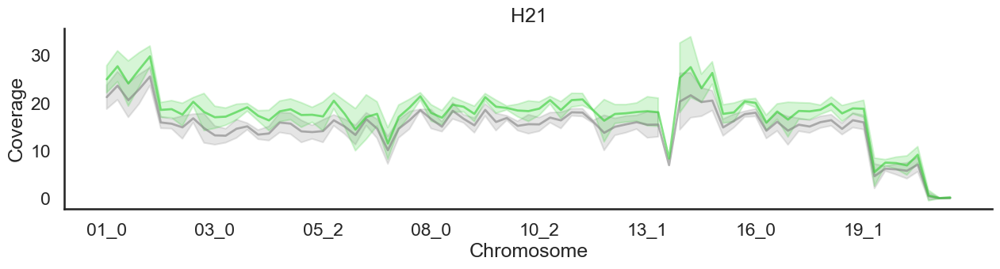

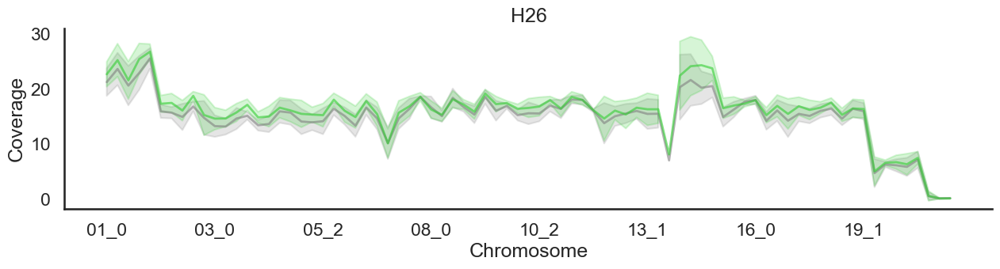

...

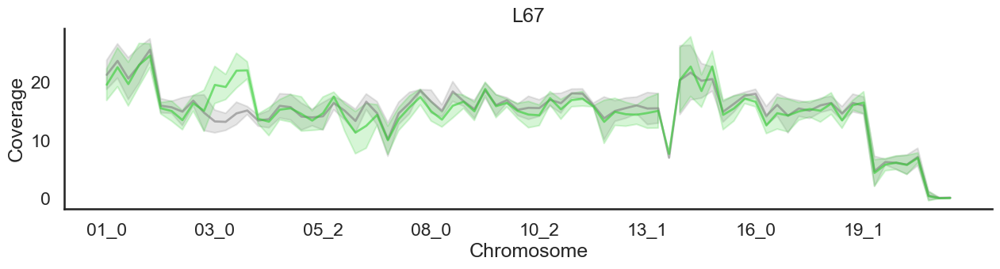

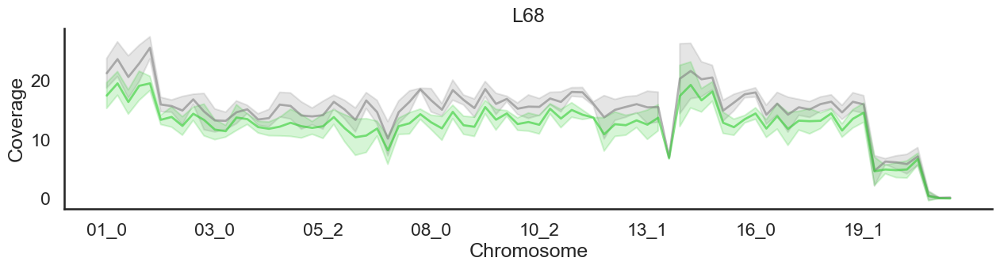

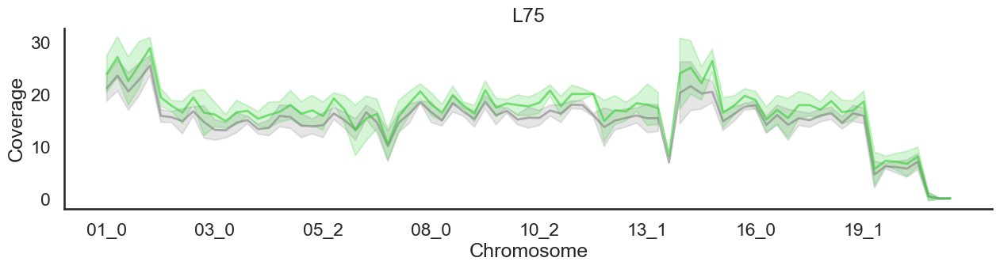

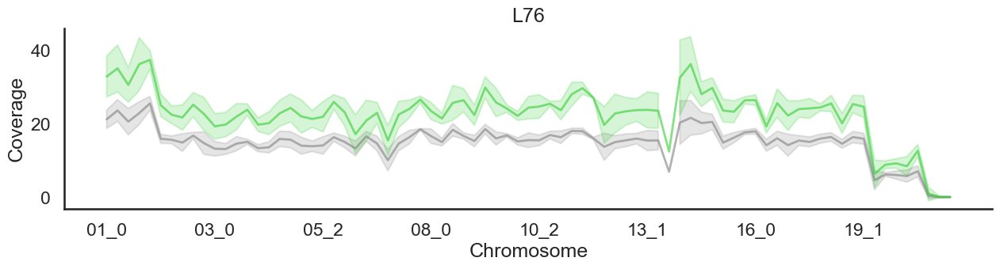

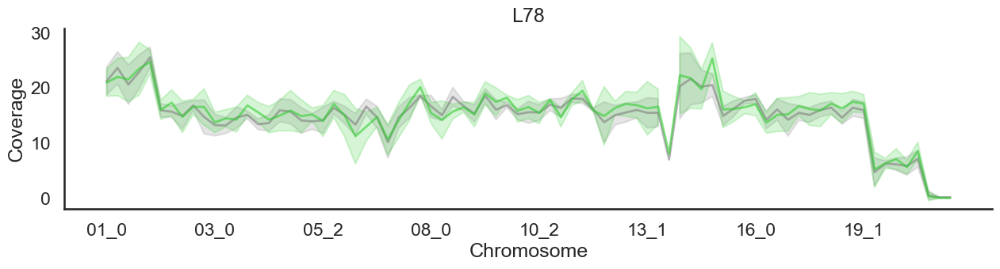

In [38]:
for x in df_plot_rescale:
    if x.startswith('W') or x.startswith('H') or x.startswith('L'):
        plotComparisonTracks(x)

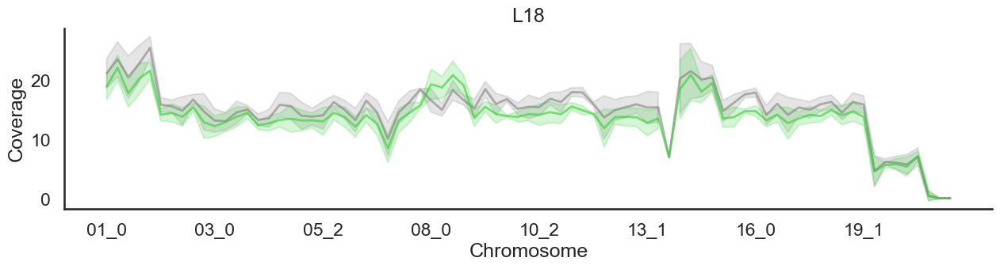

In [39]:
plotComparisonTracks('L18')

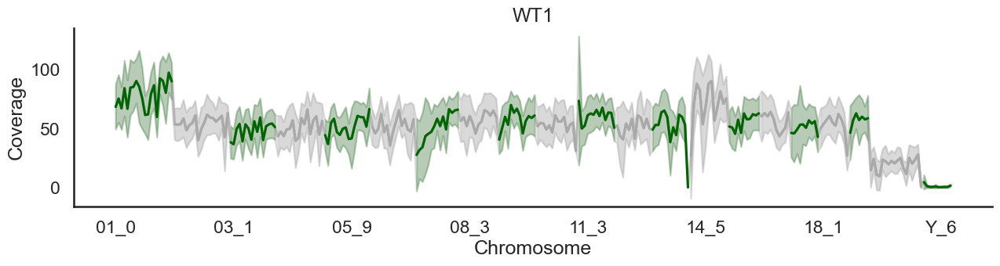

In [40]:
plotChromosomeTracks('WT1')

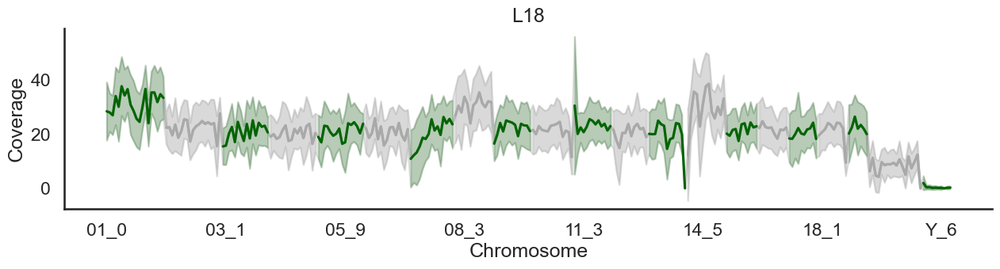

In [41]:
plotChromosomeTracks('L18')

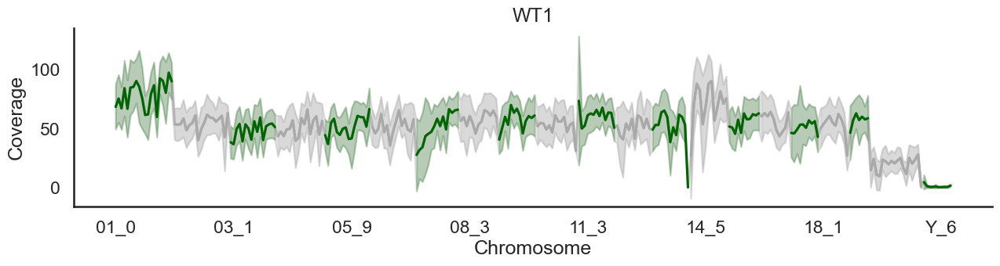

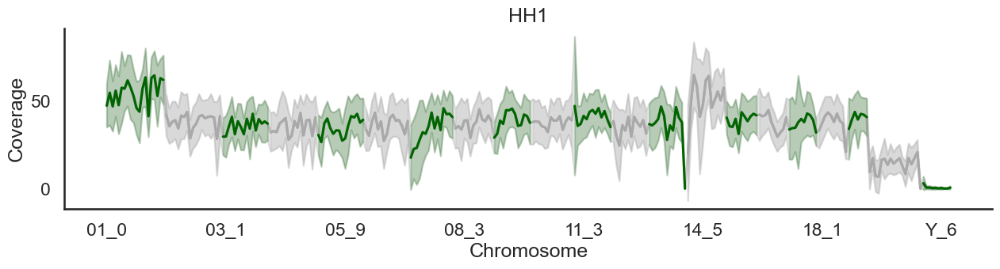

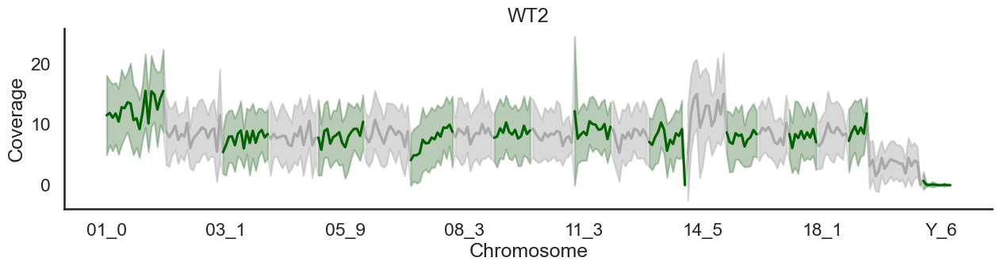

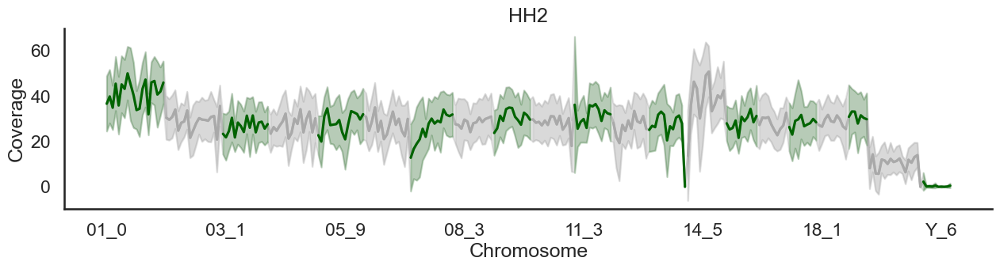

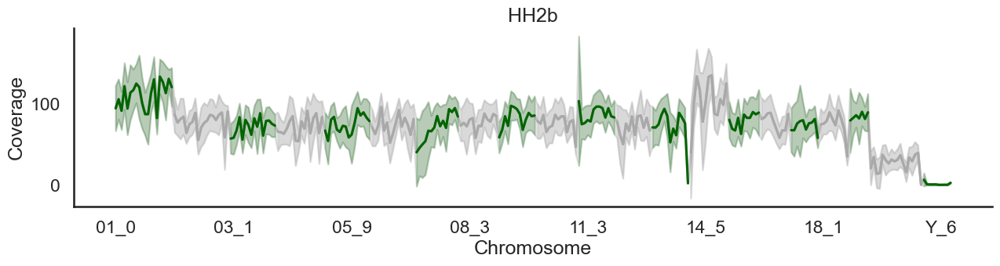

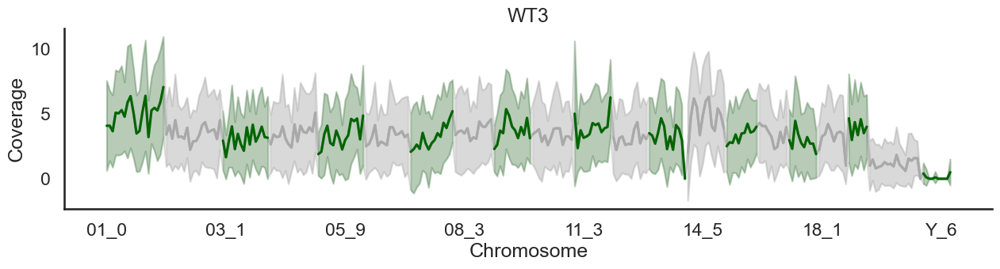

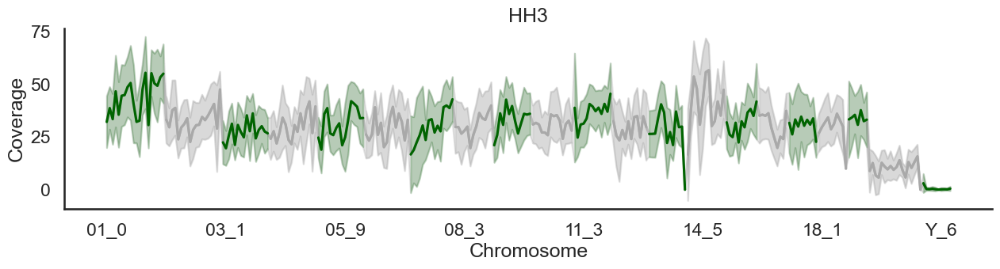

In [44]:
for x in df_plot_rescale:
    if x.startswith('W') or x.startswith('HH'):# or x.startswith('L'):
        plotChromosomeTracks(x)